<a href="https://colab.research.google.com/github/Camila-RojasUIS/Python---T-picos/blob/main/BONO_PRIMER_EXAMEN_PARTE_I.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# INTRODUCCIÓN

El análisis de datos cuantitativos es esencial en la estadística descriptiva para resumir y comprender información clave. En este trabajo, exploraremos la base de datos nac2020.csv, que contiene estadísticas de nacimientos en Colombia, para responder a preguntas importantes sobre dos variables: la edad de los padres (EDAD_PADRE) y el número de embarazos (N_EMB).

Utilizaremos gráficos para datos univariados cuantitativos y determinaremos las medidas descriptivas como la media y la desviación estándar. Además, evaluaremos la correlación entre estas dos variables mediante diagramas de dispersión y la recta de regresión.

Concretamente, abordaremos las siguientes preguntas:



1.  ¿Cómo se comporta la variable EDAD_PADRE?
2.  ¿Cómo se comporta la variable N_EMB?
3.  ¿Están correlacionadas y cuál es su grado de correlación?


Emplearemos herramientas estadísticas como gráficos, medidas descriptivas, pruebas de normalidad y coeficientes de correlación de Pearson, Kendall y Spearman. Los resultados y las interpretaciones se presentarán en un cuaderno de Jupyter, disponible en un repositorio personal de GitHub, proporcionando una comprensión clara y detallada del análisis.



# Estadística descriptiva para variables cuantitativas.


*   Gráficos para datos univariados cuantitativos
*   determinar las medidas descrptivas para datos univariados cuantitativos

In [2]:
from google.colab import files # Para cargar archivos en google colab
uploaded = files.upload()

Saving nac2020.csv to nac2020.csv


In [3]:
import pandas as pd
import io
io_csv = io.BytesIO(uploaded['nac2020.csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)



,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
44,560,3,2,NaN,2,9,9,2020,11,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5


In [4]:
df = tabla[["EDAD_PADRE", "EDAD_MADRE", "N_EMB"]]
df.head(3)

,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1


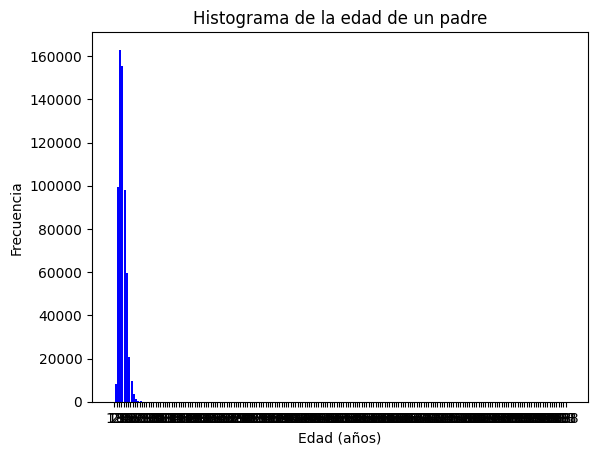

In [5]:
import matplotlib.pyplot as plot
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE) + 1, 5)
plot.hist(df.EDAD_PADRE, bins=intervalos, color='blue', rwidth=0.85)
plot.title('Histograma de la edad de un padre')
plot.xlabel('Edad (años)')
plot.ylabel('Frecuencia')
plot.xticks(intervalos)
plot.show()


In [6]:
df1 = df[(df.EDAD_PADRE < 120) & (df.EDAD_MADRE != 99) & (df.N_EMB != 99)]
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1
44,20,5,1
44,20,3,1


<ipython-input-7-f9e21c453e7c>:14: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")


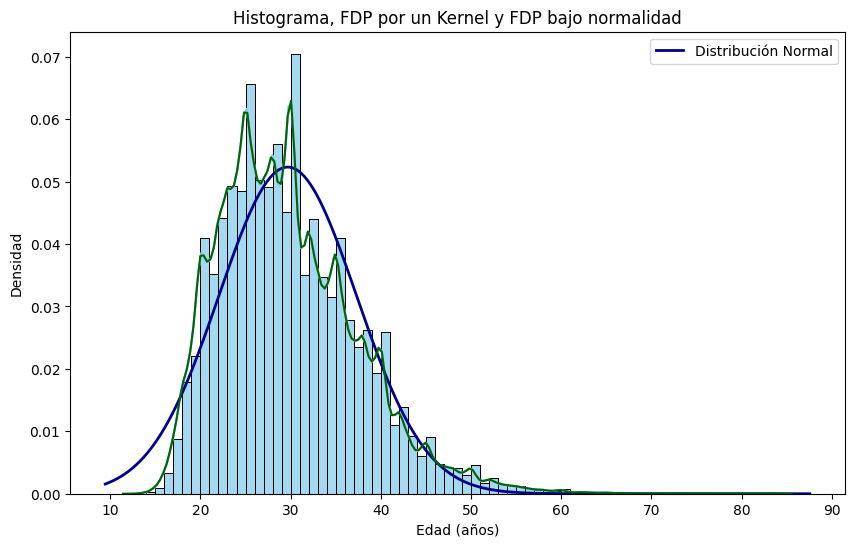

In [7]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor='black') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell
sns.histplot(x=df1.EDAD_PADRE, bins=intervalos1, kde=True, stat="density", color= "skyblue", edgecolor="black")

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()


Sea $X: =$ Edad del padre de un recién nacido en Colombia.
Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel (línea color cyan) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea color azul), $X\sim \text{Normal} (\text{Media} = \bar{x}, \text{Varianza} = S^2_x)$


<ipython-input-12-8df5ecf9fb43>:10: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")


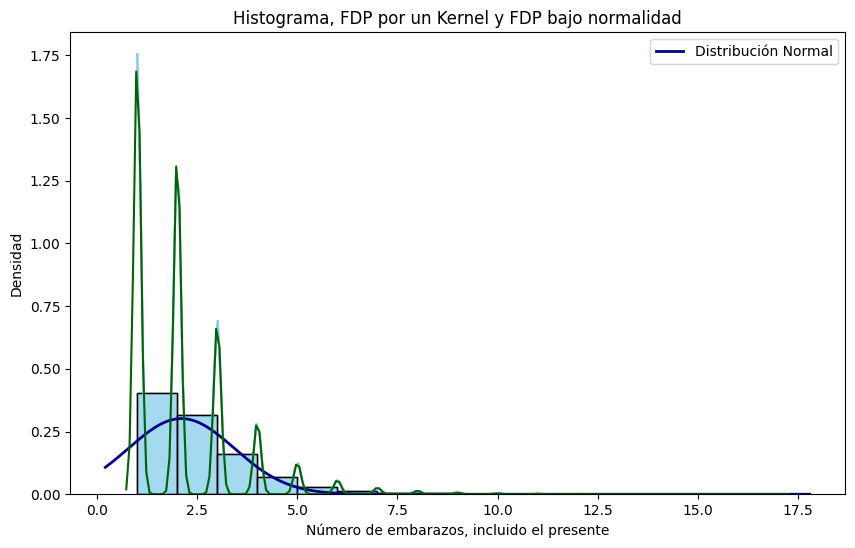

In [12]:
intervalos2 = range(min(df1.N_EMB), max(df1.N_EMB) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.N_EMB, bins = intervalos2, kde = True, stat = "density", color = "skyblue", edgecolor='black') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell
sns.histplot(x=df1.N_EMB, bins=intervalos2, kde=True, stat="density", color= "skyblue", edgecolor="black")

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.N_EMB), np.std(df1.N_EMB))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")
sns.kdeplot(x=df1.N_EMB, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Número de embarazos, incluido el presente')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()

Sea $X: =$ Número de embarazos, incluido el presente.
Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método Kernel (línea color cyan) no coincide con la función de densidad de probabilidad asumiendo el supuesto de normalidad (línea color azul), $X\sim \text{Normal} (\text{Media} = \bar{x}, \text{Varianza} = S^2_x)$

In [8]:
from scipy.stats import shapiro
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.958814799785614, pvalue=0.0)

In [10]:
shapiro(df1.N_EMB)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.7744329571723938, pvalue=0.0)



*   Si el **valor p** es una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%
*   Si el **valor p** es una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%

En nuestro caso particula, tenemos que para ambos pvalue=0.0 < 0.05, es decir, se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia y el número de embarazos, incluido el presente presenta distribución normal.



In [9]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)

619932

In [22]:
idx =np.random.randint(len(df1.EDAD_PADRE), size=100)
idx
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=0.8491050004959106, pvalue=1.0991122678660759e-08)

In [23]:
idx =np.random.randint(len(df1.N_EMB), size=100)
idx
shapiro(df1.N_EMB.index[idx])

ShapiroResult(statistic=0.8580276966094971, pvalue=2.3751095312718462e-08)



*   Como el valor p (igual a $1.0991122678660759 \times 10^{-8}$) es menor que 0.05, entonces se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal
*   Como el valor p (igual a $2.3751095312718462 \times 10^{-8}$) es menor que 0.05, entonces se rechaza que la variable aleatoria de número de embarazos, incluido el presente  presenta distribución normal.



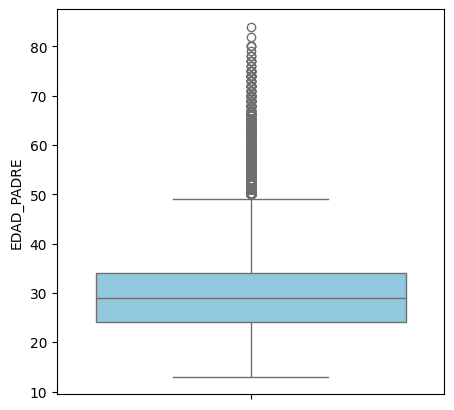

In [12]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.EDAD_PADRE, color='skyblue', saturation=0.75)
plt.show()

Se considera que la edad de un padre de un recién nacido en Colombia es atípica si es mayor que 50 años. El primer cuartil es aproximadamente 25 años, la media aritmética es aproximadamente 29 años y el tercer cuartil es aproximadamente 35 años.

$\text{Rango intercuartílico = Tercer cuartil - Primer cuartil} = 35 - 25 = 10$


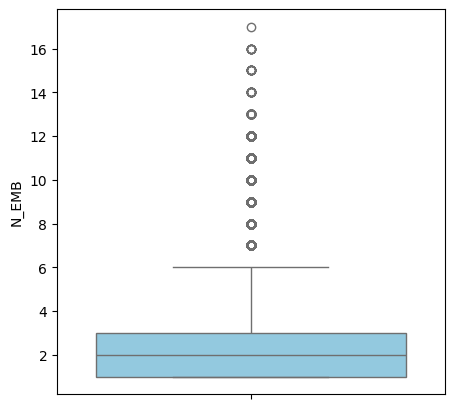

In [24]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.N_EMB, color='skyblue', saturation=0.75)
plt.show()

Se considera que el número de embarazos, incluido el presente  es atípica si es mayor que 6. El primer cuartil es aproximadamente 1 embarazo, la media aritmética es aproximadamente 2 embarazos y el tercer cuartil es aproximadamente 3 embarazos.

**Rango intercuartílico = Tercer cuartil - Primer cuartil= 3 - 1 = 2**

In [25]:
import plotly.express as px
plt.figure(figsize=(5, 5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()


<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién Nacido en Colombia.

In [27]:
import numpy as np
from scipy.stats import skew, kurtosis

print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza {np.var(df1.EDAD_PADRE)} y la desviación estándar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")

Media: 29.67728396017628
Varianza 58.13749376325272 y la desviación estándar es de 7.624794670235568
Asimetría: 0.8353050307248143
Curtosis: 0.9739372918657319



*   Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 29.7 años.
*   Aproximadamente la distancia entre los valores de la edad un padre de un recién nacido en Colombia y la media es de 7.62 años
*   La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria.
*   La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media.






In [28]:
print(f"Media: {np.mean(df1.N_EMB)}")
print(f"Varianza {np.var(df1.N_EMB)} y la desviación estándar es de {np.std(df1.N_EMB)}")
print(f"Asimetría: {skew(df1.N_EMB)}")
print(f"Curtosis: {kurtosis(df1.N_EMB)}")

Media: 2.102030545285612
Varianza 1.7488730440590166 y la desviación estándar es de 1.32244963762671
Asimetría: 1.9222969798771323
Curtosis: 6.016495893676325


*   Aproximadamente el promedio del número de embarazos, incluido el presente  es de 2.10 embarazos.
*   Aproximadamente la distancia entre los valores de del número de embarazos, incluido el presente y la media es de 1.322.
*   La distribución  del número de embarazos, incluido el presente es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria.
*   La distribución es leptocúrtica, es decir, hay una alta concentración del número de embarazos, incluido el presente con respecto a la media.

**Seguimos con...**

Vamos a determinar si una variable está correlacionada o depende de otras variable, esto lo hacemos descrptivamente utlizando:



*   Diagrama de dispersión y la recta de regresión para datos bivariados



Una variable depende de la otra, cuando la ejecución de esta se ve afectada por la variable independiente. *Ejemplo* : El precio de una vivienda depende del número de habitaciones, ya que entre más habitaciones se tiene mayor precio.

Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de dependencia. *Ejemplo* : Consumo de arroz y de carne, ya que se ha visto que al comerse más arroz se come más carne, pero no hay una dependencia entre estas dos variables.

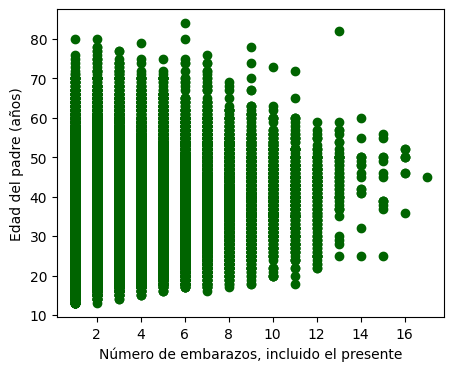

In [29]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "darkgreen", marker = "o")
plt.xlabel('Número de embarazos, incluido el presente')
plt.ylabel('Edad del padre (años)')
plt.show()

Se observa en el diagrama de dispersión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no están correlacionadas. Para nuestro ejemplo quiere decir que el número de embarazos, incluido el presente y la edad de un padre en Colombia no están correlacionadas.

In [30]:
from sklearn.linear_model import LinearRegression
modelo = LinearRegression()
# df1["N_EMB"] es igual a escribir df1.N_EMB
modelo.fit(np.array(df1.N_EMB).reshape(-1, 1), np.array(df1["EDAD_PADRE"]).reshape(-1, 1))
predi_lineal = modelo.predict(np.array(df1.N_EMB).reshape(-1, 1))
predi_lineal

array([[27.43380069],
       [27.43380069],
       [27.43380069],
       ...,
       [29.469573  ],
       [27.43380069],
       [27.43380069]])

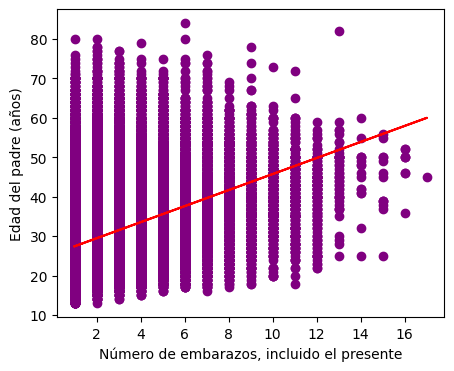

In [31]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.plot(df1["N_EMB"], predi_lineal, linestyle='-', color = "red")
plt.xlabel('Número de embarazos, incluido el presente')
plt.ylabel('Edad del padre (años)')
plt.show()

De acuerdo con la recta de regresión se determina una correlación positiva, es decir que entre más embarazos incluido el presente, más años tiene esta persona.

*La variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y.*

In [32]:
from scipy.stats import spearmanr, kendalltau

In [33]:
coef_pearson = np.corrcoef(df1["N_EMB"], df1["EDAD_PADRE"])[0, 1]
coef_spearman, _ = spearmanr(df1["N_EMB"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_EMB"], df1["EDAD_PADRE"])
print(f"Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")


Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente 0.3530857510781986, 0.37998015979212696 y 0.29695921176068596.


Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:

Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174.[Link](https://pdfs.semanticscholar.org/7e73/43a5608fff1c68c5259db0c77b9193f1546d.pdf)




*  X y Y son independientes o no están correlacionadas: $\rho (X,Y) \approx 0, \eta (X,Y) \approx 0, \kappa (X,Y) \approx 0$
*   Y depende insignificativamente de X o X y Y están insignificativamente correlacionadas si $0 < \vert \rho (X,Y) \vert < 0.2$, $0 < \eta (X,Y) \vert < 0.2$, $0 < \vert \kappa (X,Y) \vert < 0.2$
*   Y depende discretamente de X o X y Y están discretamente correlacionadas si $0.2 < \vert \rho (X,Y) \vert < 0.4$, $0.2 < \eta (X,Y) \vert < 0.4$, $0.2 < \vert \kappa (X,Y) \vert < 0.4$
*   Y depende moderadamente de X o X y Y están moderadamente correlacionadas si $0.4 < \vert \rho (X,Y) \vert < 0.6$, $0.4 < \eta (X,Y) \vert < 0.6$, $0.4 < \vert \kappa (X,Y) \vert < 0.6$
*   Y depende sustancialmente de X o X y Y están sustancialmente correlacionadas si $0.6 < \vert \rho (X,Y) \vert < 0.8$, $0.6 < \eta (X,Y) \vert < 0.8$, $0.6 < \vert \kappa (X,Y) \vert < 0.8$
*   Y depende fuertemente de X o X y Y están fuertemente correlacionadas si $0.8 < \vert \rho (X,Y) \vert < 1$, $0.8 < \eta (X,Y) \vert < 1$, $0.8 < \vert \kappa (X,Y) \vert < 1$








De acuerdo con los coeficientes de correlación de Pearson, de Kendall y de Spearman se determina que el número de hijos de un padre y la edad de un padre de un recién nacido en Colombia están discretamente correlacionadas.

**CONCLUSIÓN**

El análisis de la base de datos nac2020.csv revela que tanto la edad de los padres de recién nacidos en Colombia como el número de embarazos no siguen una distribución normal. La edad de los padres es atípica si supera los 50 años y el número de embarazos es atípico si supera los 6. Aunque inicialmente parecen independientes, la recta de regresión y los coeficientes de correlación indican una relación discreta y positiva entre ambas variables. Esto proporciona una visión valiosa sobre las características demográficas y reproductivas en Colombia.